# Goal
Register mouse brain to atlas:

M30/mba_converted_imaging_data/PMD1212&1211/PMD1211

This brain is 40 microns between Nissls, where each section is 20 microns thick

# Import libraries

In [1]:
import sys
sys.path.append('/home/daniel/Documents/shadowing/emlddmm/')
import numpy as np
import emlddmm
import matplotlib.pyplot as plt
%matplotlib widget
from os.path import join,basename,split,splitext
from os import makedirs
import torch
import tifffile
from glob import glob
from scipy.interpolate import interpn
plt.set_loglevel('CRITICAL')

# Load our nissl dataset

In [3]:
dz = 40.0 # 40 microns spacing between planes (20um thick)
dx = 0.46*32 # 14.72 microns, after downsampling by a factor of 32

In [4]:
# we will downsample to about 50 microns, 
# we will downsample by 2, twice
ndown = 2 # means downsample by 2 twice
dx*2**ndown

58.88

# set up files

In [5]:
# where to save outputs
outprefix = 'Documents/shadowing/PMD1211_registration/'
outdir = split(outprefix)[0]
if not outdir:
    outdir = '.'
makedirs(outdir,exist_ok=True)

In [6]:
outdir

'Documents/shadowing/PMD1211_registration'

In [7]:
# file matching pattern for fluoro and nissl
patternF = '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/*-F*.tif'
patternN = '/nfs/data/main/M38/PMD1211_rotation_corrected/*.tif'

In [8]:
files = glob(patternN)

In [9]:
def key0(x):
    ''' Define a sorting function that extracts the slice number from the filename
    First nissl then IHC
    '''
    return splitext(basename(x))[0].split('1')[1]

In [10]:
def key(x):
    ''' Define a sorting function that extracts the slice number from the filename'''
    return int(splitext(basename(x))[0].split('_')[-1])

In [11]:
files.sort(key=key0,reverse=True)
files.sort(key=key)
files

['/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N1-2013.01.17-08.36.35_PMD1211_1_0001.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N1-2013.01.17-08.36.35_PMD1211_2_0002.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N1-2013.01.17-08.36.35_PMD1211_3_0003.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N2-2013.01.17-08.41.53_PMD1211_1_0004.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N2-2013.01.17-08.41.53_PMD1211_2_0005.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N2-2013.01.17-08.41.53_PMD1211_3_0006.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N3-2013.01.17-08.46.37_PMD1211_1_0007.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N3-2013.01.17-08.46.37_PMD1211_2_0008.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212&1211-N3-2013.01.17-08.46.37_PMD1211_3_0009.tif',
 '/nfs/data/main/M38/PMD1211_rotation_corrected/PMD1212

In [251]:
filesF = glob(patternF)
filesF.sort(key=key)
filesF

['/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_1_0001.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_2_0002.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_3_0003.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.03.16-16.56.26_PMD1211_1_0004.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.01.11-12.32.51_PMD1211_2_0005.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.01.11-12.32.51_PMD1211_3_0006.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F3-2013.01.11-12.47.00_PMD1211_1_0007.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F3-2013.01.11-12.47.00_PMD1211_2_000

In [252]:
len(files),len(filesF)

(261, 381)

In [14]:
locations = np.array([int(key(f)) for f in files],dtype=float)
for i in range(len(files)):
    if 'IHC' in files[i]:
        locations[i] += 0.5

In [15]:
locations

array([  1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
        12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,
        23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,
        34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,
        45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,
        56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,
        67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,
        78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,
        89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99.,
       100., 101., 102., 103., 104., 105., 106., 107., 108., 109., 110.,
       111., 112., 113., 114., 115., 116., 117., 118., 119., 120., 121.,
       122., 123., 124., 125., 126., 127., 128., 129., 130., 131., 132.,
       133., 134., 135., 136., 137., 138., 139., 140., 141., 145., 146.,
       147., 148., 149., 150., 151., 152., 153., 15

In [16]:
#find all the unique numbers from the first slice to the last slice
all_locations = np.arange(locations[0],locations[-1]+1) 
missing_locations = np.array([a not in locations for a in all_locations])
good_locations = np.logical_not(missing_locations)
print(np.sum(missing_locations)) 

3


In [17]:
all_locations

array([  1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
        12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,
        23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,
        34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,
        45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,
        56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,
        67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,
        78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,
        89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99.,
       100., 101., 102., 103., 104., 105., 106., 107., 108., 109., 110.,
       111., 112., 113., 114., 115., 116., 117., 118., 119., 120., 121.,
       122., 123., 124., 125., 126., 127., 128., 129., 130., 131., 132.,
       133., 134., 135., 136., 137., 138., 139., 140., 141., 142., 143.,
       144., 145., 146., 147., 148., 149., 150., 15

In [18]:
# set up a coordinate system with 0 in the center
# now we have a z position for all the slices, including any missing ones
zJ = np.arange(len(all_locations))*dz - (len(all_locations)-1)*dz/2


# Load and process the nissl files

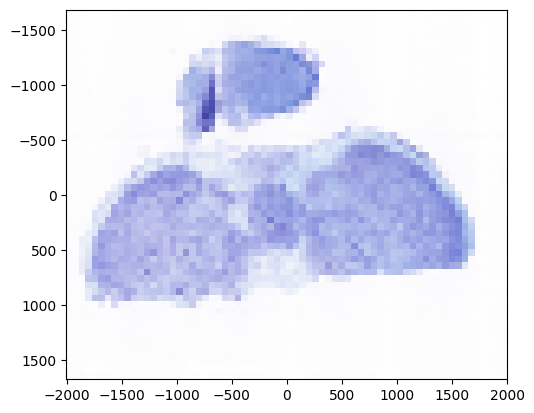

/home/daniel/Documents/shadowing/emlddmm/emlddmm.py:554: RuntimeWarning: divide by zero encountered in divide
  Id = Id / (Wd + Wd.max()*1e-6)
/home/daniel/Documents/shadowing/emlddmm/emlddmm.py:554: RuntimeWarning: invalid value encountered in divide
  Id = Id / (Wd + Wd.max()*1e-6)


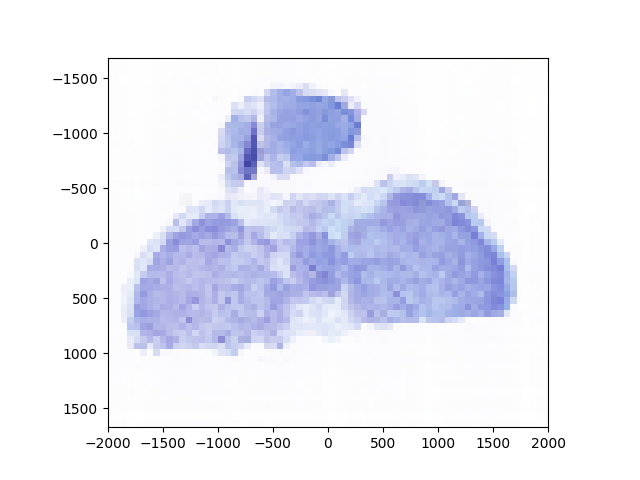

In [19]:

# load the files
fig,ax = plt.subplots()
hfig = display(fig,display_id=True)
J_ = []
W_ = []
xJ_ = []
nJ_ = []
count = 0
for i in range(len(all_locations)):
    if good_locations[i]:
        Ji = tifffile.imread(files[count])
        if Ji.dtype == np.uint8:
            Ji = Ji/255.0
        #Wi = np.ones_like(Ji[...,0])
        # check for rows or cols of 1s
        # this W variable will be 0 where pixels are bad, and 1 where pixels are good
        #Wi = np.logical_not( (np.all(Ji==1.0,axis=(0,-1),keepdims=True) + np.all(Ji==1.0,axis=(1,-1),keepdims=True)))[...,0]*1.0
        Wi = 1-np.all(Ji==1.0,axis=-1)
        count += 1
    else:
        # if it is missing just use a blank image and zero weights
        # insert a tiny image, and flag every pixel as bad
        Ji = np.zeros((11,11,3))
        Wi = np.zeros((11,11))
    
    nJi = np.array(Wi.shape)
    xJi = [np.arange(n)*dx - (n-1)*dx/2 for n in nJi]
    # downsample the dataset so it is about 50 microns
    xJi,Ji,Wi = emlddmm.downsample_image_domain(xJi,Ji.transpose(-1,0,1),[2**ndown]*2,Wi)
    nJi = np.array(Wi.shape)
    Wi[np.isnan(Wi)] = 0
    Ji[np.isnan(Ji)] = 1

    # normalize the data, such that the brightest pixel is white
    try:
        q = np.quantile(Ji[:,Wi==1],0.99,axis=(1))
        Ji = Ji / q[...,None,None]
        Ji = Ji.clip(0,1)
    except:
        pass
    
    
    nJ_.append(nJi)    
    xJ_.append(xJi)
    J_.append(Ji)
    W_.append(Wi)

    ax.cla()
    ax.imshow(Ji.transpose(1,2,0),extent=emlddmm.extent_from_x(xJi))
    fig.canvas.draw()
    hfig.update(fig)
    
    
    
    

In [20]:
from scipy.ndimage import gaussian_filter

In [21]:
# find a size and interpolate images to this fixed size
q = np.ceil(np.quantile(nJ_,[0.95],0)).astype(int)
nJ = np.concatenate([[len(all_locations)],q.squeeze()])
dJ = np.array([dz,dx*2**ndown,dx*2**ndown])
xJ = [np.arange(n)*d - (n-1)*d/2 for n,d in zip(nJ,dJ)]
XJ2d = np.stack(np.meshgrid(*xJ[1:],indexing='ij'),-1)
J__ = []
W__ = []
A2d0 = np.eye(3)[None].repeat(len(J_),axis=0)
for i in range(len(J_)):
    # update A2d based on COM?

    Jb = gaussian_filter(J_[i],sigma=(0,5,5))
    #Wb = gaussian_filter(W_[i],sigma=(5,5))
    Wb = W_[i]
    Jb = 1-np.mean(Jb,0)
    Jb0 = np.sum(Jb*Wb)
    Jb10 = np.sum( Jb*Wb*xJ_[i][0][:,None] )
    Jb11 = np.sum(Jb*Wb*xJ_[i][1])
    com = [Jb10/Jb0, Jb11/Jb0]
    A2d0[i][:2,-1] = com
    Xs = (A2d0[i][:2,:2]@XJ2d[...,None])[...,0] + A2d0[i][:2,-1]    
    
    Xs = XJ2d
    Jout = interpn(xJ_[i],(J_[i]*W_[i]).transpose(1,2,0),Xs,bounds_error=False,fill_value=0).transpose(-1,0,1)
    Wout = interpn(xJ_[i],(W_[i]),Xs,bounds_error=False,fill_value=0,method='nearest')
    Jout = Jout/Wout
    Jout[np.isnan(Jout)] = 1
    Jout[np.isinf(Jout)] = 1
    Wout = (Wout==1.0).astype(float)

    J__.append(Jout)
    W__.append(Wout)
    
J__ = np.stack(J__,1)
W__ = np.stack(W__,0)

/tmp/ipykernel_1115386/414973772.py:27: RuntimeWarning: divide by zero encountered in divide
  Jout = Jout/Wout
/tmp/ipykernel_1115386/414973772.py:27: RuntimeWarning: invalid value encountered in divide
  Jout = Jout/Wout
/tmp/ipykernel_1115386/414973772.py:20: RuntimeWarning: invalid value encountered in scalar divide
  com = [Jb10/Jb0, Jb11/Jb0]


In [22]:
J__ = J__.clip(0,1)

In [23]:
J__.shape,[x[1] - x[0] for x in xJ]

((3, 264, 179, 210), [40.0, 58.88000000000011, 58.88000000000011])

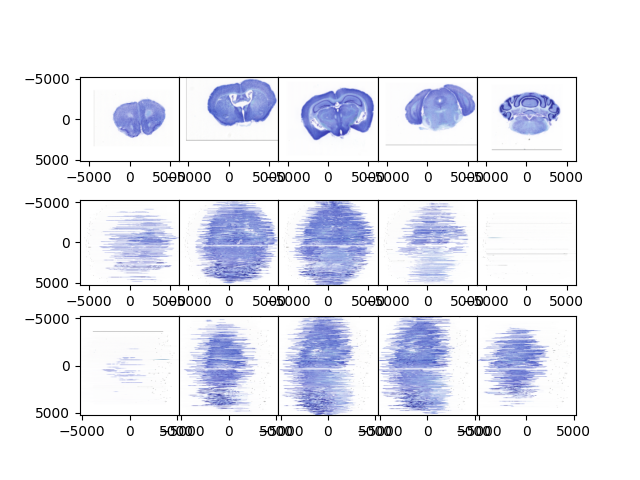

In [24]:
fig,ax = emlddmm.draw(J__,xJ,vmin=0,vmax=1)

In [25]:
A2d0save = A2d0.copy()

In [26]:
A2d0 = A2d0save.copy()

In [32]:
A2d0[np.isnan(A2d0)] = 0

In [47]:
orientation_nissl = 'PIR' # first axis points posterior, second points inferior, third points right

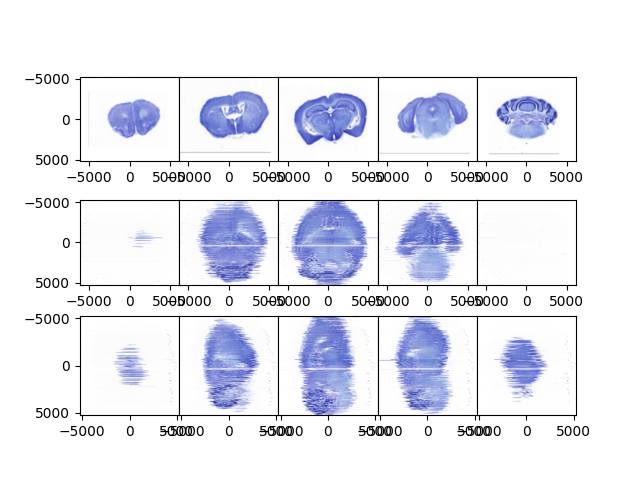

In [34]:
R = emlddmm.compose_sequence([emlddmm.Transform(A2d0,'f')],xJ)
RiJ = emlddmm.apply_transform_float(xJ,J__,R)
fig,ax = emlddmm.draw(RiJ,xJ,vmin=0,vmax=1)
fig.canvas.draw()

In [35]:
J__.shape

(3, 264, 179, 210)

# Load the 3D image

I will load our reasonably good sagittal atlas

[0.019999999999999574, 0.019999999999999574, 0.019999999999999574]


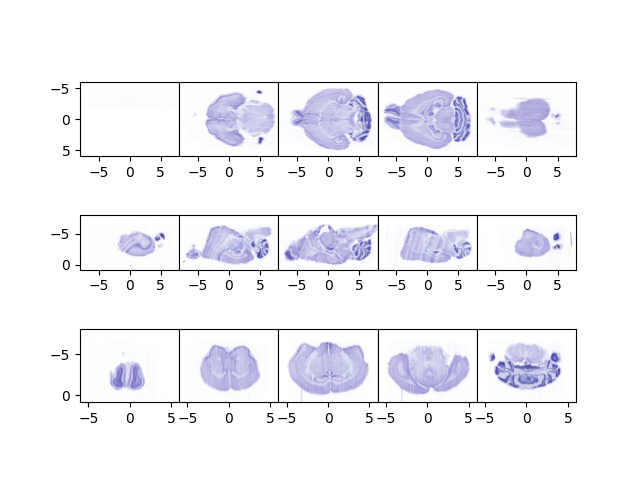

In [44]:
fnamesI = [
    'nissl_atlas_2025_tmp.vtk',    
]


I = []
for f in fnamesI:
    xI,I_,_,_ = emlddmm.read_data(f)
    I_ = I_ /255.0
    #I_ = I_ / np.mean(np.abs(I_))
    I.append(I_)
I = np.concatenate(I,0)
fig,ax = emlddmm.draw(I,xI,vmin=0,vmax=1)
dI = [x[1] - x[0] for x in xI]
print(dI)


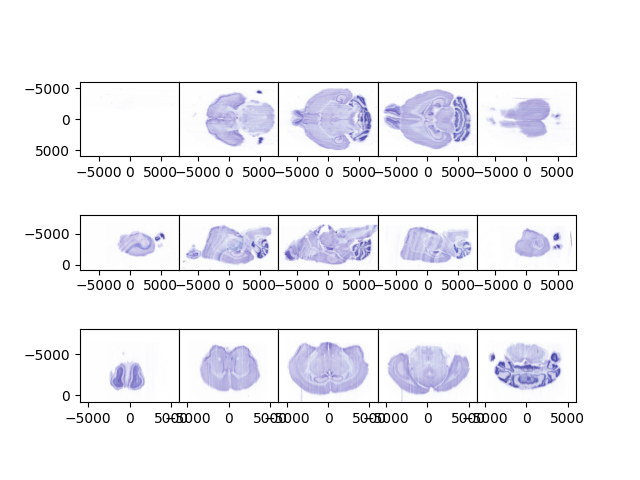

In [62]:
# convert from mm to micron
xI = [x*1000 for x in xI]
dI = np.array(dI) * 1000
fig,ax = emlddmm.draw(I,xI,vmin=0,vmax=1)

In [63]:
dI

array([20., 20., 20.])

In [64]:
orientation_mri = 'SLP' # first axis superior, second axis let, third axis posterior

# Set up the registration

In [106]:
# get an initial transform from 3d to 2d
L = emlddmm.orientation_to_orientation(orientation_mri, orientation_nissl)
# make it bigger to help avoid local minima
L = 0.9*L
# affine transformation matrix
T = np.array([-1000.0,-3000.0,0.0])
A = np.concatenate([L,T[...,None]],-1)
A = np.concatenate((A,np.array([[0.,0,0,1]])))

# want nose up
theta = 0*np.pi/180
A = np.array([[np.cos(theta),0.0,-np.sin(theta),0.0],
             [0.0,1.0,0.0,0.0],
             [np.sin(theta),0.0,np.cos(theta),0.0],
             [0.0,0.0,0.0,1.0]])@A

theta = -0*np.pi/180
A = np.array([[np.cos(theta),-np.sin(theta),0,0.0],
             [np.sin(theta),np.cos(theta),0.0,0.0],
             [0.0,0.0,1.0,0.0],
             [0.0,0.0,0.0,1.0]])@A


A[:3,-1] = A[:3,-1] + np.array([-0,-0.0,0.0])





# check that our initial alignment is good
tform = emlddmm.compose_sequence([emlddmm.Transform(A,'b')],xJ)
AI = emlddmm.apply_transform_float(xI,I,tform)

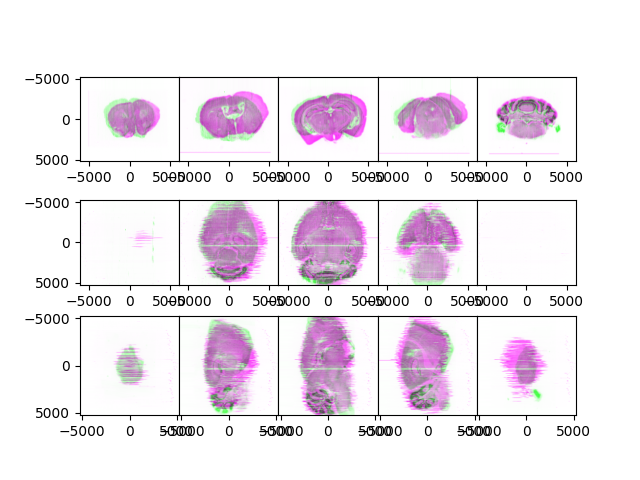

In [107]:
#fig,ax = emlddmm.draw(np.concatenate((AI,1-J__),0),xJ)
fig,ax = emlddmm.draw(np.concatenate((AI[0,None],RiJ[0,None]),0),xJ,vmin=0,vmax=1)


In [108]:
# downsampling
resolutions = [200.0,100.0,50.0]

In [109]:
def down_from_res(dI,res,is_2d=False):
    downI = np.round(res/dI).astype(int)
    if is_2d:
        downI[0] = 1
    return downI
        
    

In [110]:
downI = down_from_res(dI,resolutions[0])
downI

array([10, 10, 10])

In [111]:
downJ = down_from_res(dJ,resolutions[0],is_2d=True)
downJ

array([1, 3, 3])

In [127]:
# 
factor = 2

config0 = {
    'device':'cpu',    
    'downJ':downJ,    
    'downI':downI,
    'n_iter': 2000,
    'A': A,
    'A2d':A2d0,
    'dv': 500.0,
    'v_start':10000*0, # big number for no deformation
    'a': 500,
    'ev': 2e-5*factor**2,
    'eA':1e5*factor**2,
    'eA2d':1e3*factor**2, 
    'sigmaR': 5e3,    
    'sigmaM': 0.1*factor,
    'sigmaB': 0.2*factor,
    'sigmaA': 0.5*factor,
    'n_reduce_step': 0,
    'muB': 1.0,
    'muA': 0.0,    
    'update_muB':False,
    'update_muA':False,
    'local_contrast': [1,32,32],
    'Amode': 0, # 1 for rigid
    'rigid_procrustes':True, # when origin is not in center
    'slice_matching':True,
    #'slice_to_average_a':dz*4, # this is causing problems
    'small':1e-13, # for matrix inverse
}

In [128]:
I_ = I # color, already have multiple channels

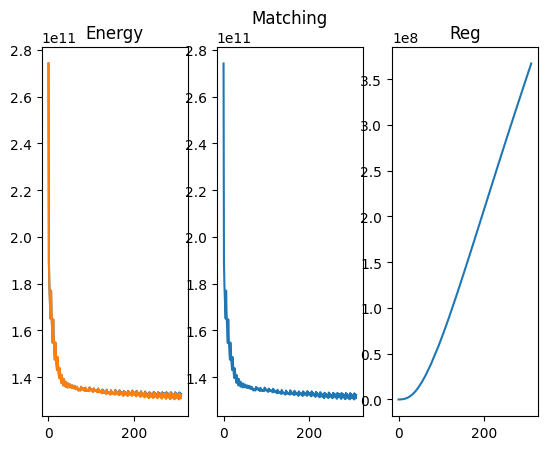

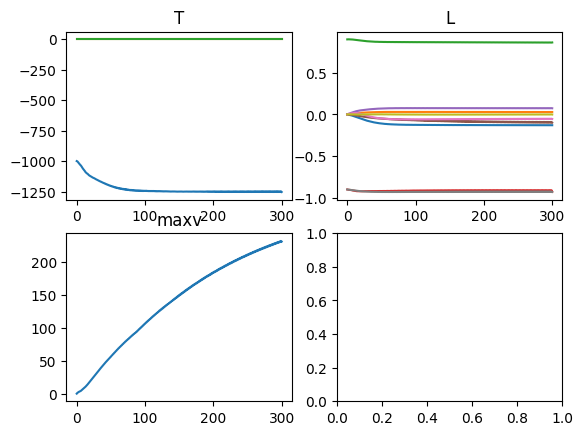

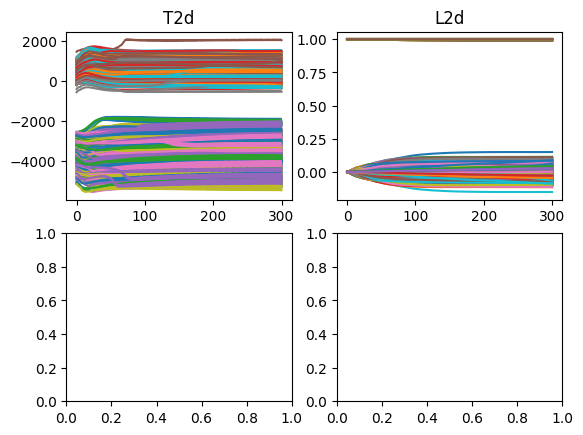

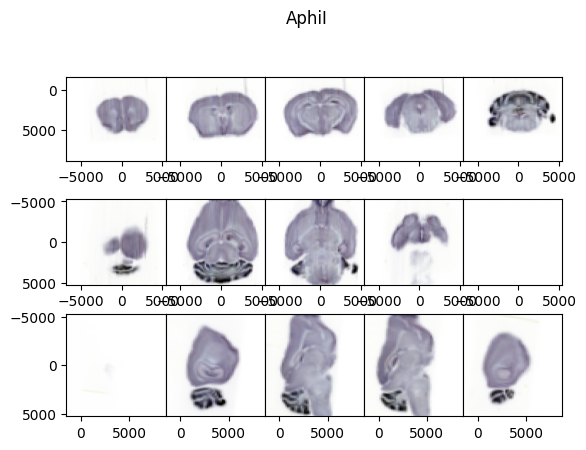

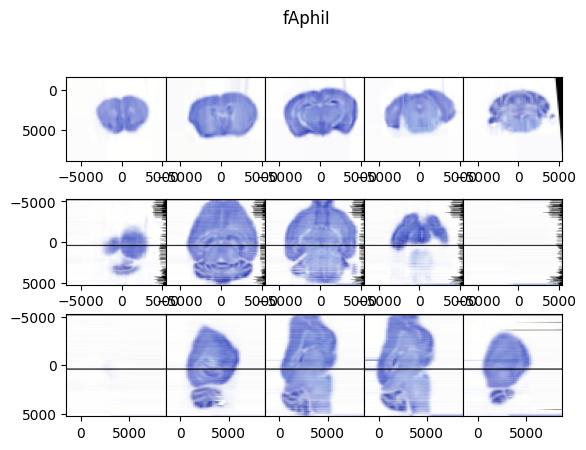

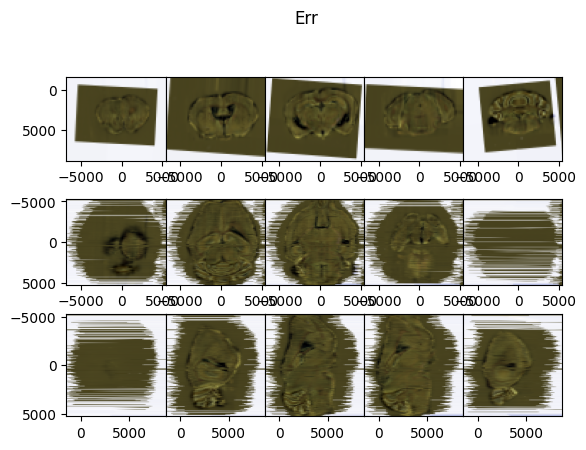

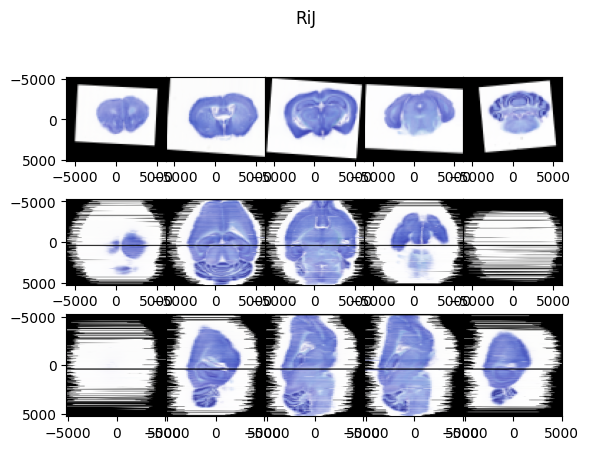

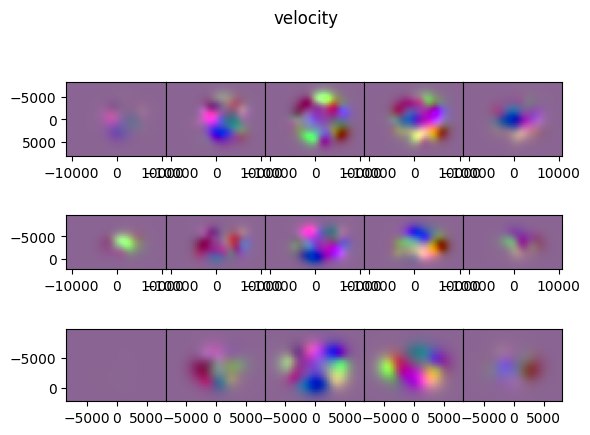

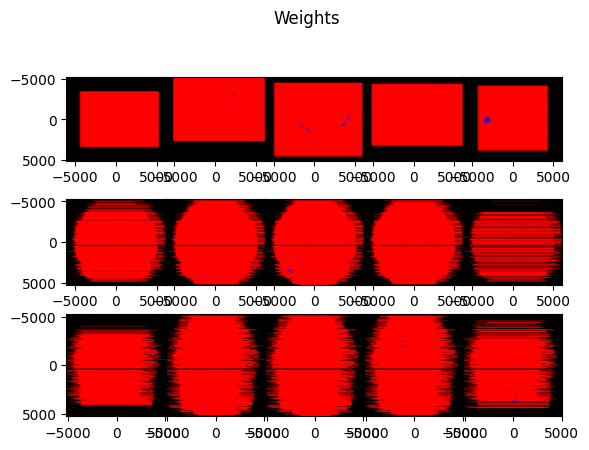

In [ ]:
import importlib
importlib.reload(emlddmm)
out0 = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J__,W0=W__,**config0)

In [130]:
outprefix

'Documents/shadowing/PMD1211_registration/'

In [131]:
# save it
np.savez(outprefix+'out0.npz', out0)


In [505]:
# load it (to test)
out0 = np.load(outprefix+'out0.npz',allow_pickle=True)['arr_0'].item()

In [303]:
# visualize the outputs
xJshift = [xJ[0],xJ[1]+4000,xJ[2]]
tform = emlddmm.compose_sequence([
    emlddmm.Transform(out0['A2d']),
],xJshift)
RiJ = emlddmm.apply_transform_float(xJ,J__,tform)

(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

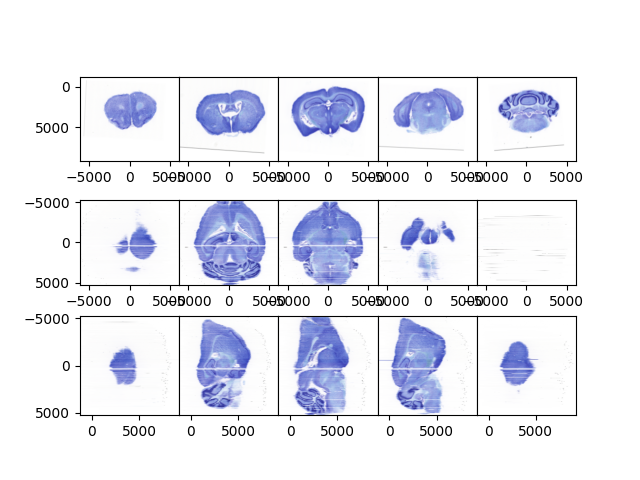

In [304]:
emlddmm.draw(RiJ,xJshift,vmin=0,vmax=1)

In [155]:
# view data in atlas space
tform_ = emlddmm.compose_sequence([
    emlddmm.Transform(out0['v'],domain=out0['xv']),
    emlddmm.Transform(out0['A']),    
],xI)



In [167]:
phiiAiJ = emlddmm.apply_transform_float(xJshift,RiJ,tform_,mode='nearest',padding_mode='zeros')
phiiAiJ[phiiAiJ==0] = 1
phiiAiJ_ = phiiAiJ

(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

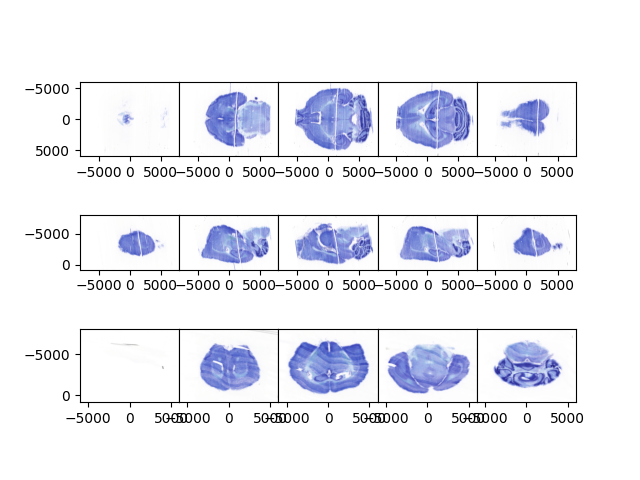

In [168]:
emlddmm.draw(phiiAiJ,xI,vmin=0,vmax=1)

Text(0.5, 0, '')

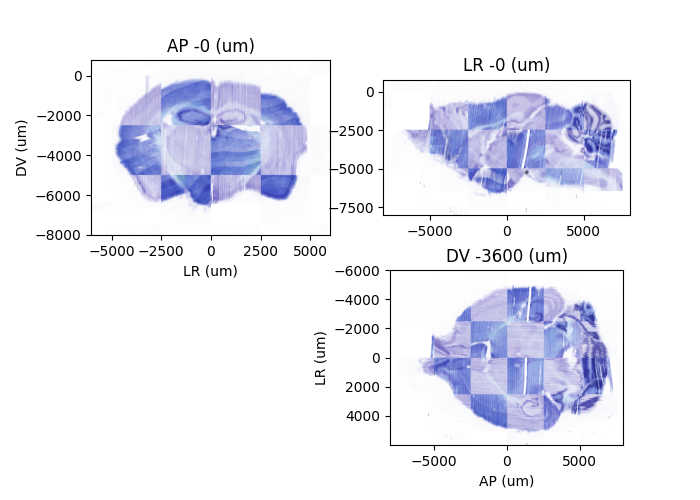

In [171]:
# prepare a grid figure to show accuracy
#fig,ax = plt.subplots(2,2)
fig = plt.figure(figsize=(7,5))
ax = np.empty((2,2),dtype=object)
D = 5000.0

# slice on the third axis
ax_ = fig.add_subplot(2,2,1)
ax[0,0] = ax_
GRID = ( (xI[0][:,None]%D > D/2) - 0.5) *( (xI[1][None,:]%D > D/2) - 0.5)*2+0.5

ax[0,0].imshow(GRID[...,None]*phiiAiJ_[:,:,:,I.shape[3]//2].permute(1,2,0).numpy() + (1-GRID[...,None])*I[:,:,:,I.shape[3]//2].transpose(1,2,0),extent=emlddmm.extent_from_x((xI[0],xI[1])))
ax[0,0].set_title(f'AP {xI[2][len(xI[2])//2]:.0f} (um)')
ax[0,0].set_xlabel(f'LR (um)')
ax[0,0].set_ylabel(f'DV (um)')
ax[0,0].invert_yaxis()



# slice on the second axis
#ax_ = fig.add_subplot(2,2,2,sharey=ax[0,0])
ax_ = fig.add_subplot(2,2,2)
ax[0,1] = ax_

GRID = ( (xI[0][:,None]%D > D/2) - 0.5) *( (xI[2][None,:]%D > D/2) - 0.5)*2+0.5

ax[0,1].imshow(GRID[...,None]*phiiAiJ_[:,:,I.shape[2]//2].permute(1,2,0).numpy() + (1-GRID[...,None])*I[:,:,I.shape[2]//2].transpose(1,2,0),extent=emlddmm.extent_from_x((xI[0],xI[2])))
ax[0,1].set_title(f'LR {xI[1][len(xI[1])//2]:.0f} (um)')
ax[0,1].set_xlabel(f'AP (um)')
ax[0,1].set_ylabel(f'DV (um)')
ax[0,1].invert_yaxis()



# slice on the first axis
#ax_ = fig.add_subplot(2,2,4,sharex=ax[0,1])
ax_ = fig.add_subplot(2,2,4,)
ax[1,1] = ax_

GRID = ( (xI[1][:,None]%D > D/2) - 0.5) *( (xI[2][None,:]%D > D/2) - 0.5)*2+0.5

ax[1,1].imshow(GRID[...,None]*phiiAiJ_[:,I.shape[1]//2].permute(1,2,0).numpy() + (1-GRID[...,None])*I[:,I.shape[1]//2].transpose(1,2,0),extent=emlddmm.extent_from_x((xI[1],xI[2])))
ax[1,1].set_title(f'DV {xI[0][len(xI[0])//2]:.0f} (um)')
ax[1,1].set_xlabel(f'AP (um)')
ax[1,1].set_ylabel(f'LR (um)')


#ax[0,1].set_yticklabels([])
ax[0,1].set_ylabel('')
#ax[0,1].set_xticklabels([])
ax[0,1].set_xlabel('')


#ax[1,0].remove()

# repeat registration at higher resolution

In [ ]:
# repeat at higher resolution, use local contrast matching, smaller step size
config1 = dict(config0)
config1.update({
    'device':'cpu',    
    'downJ':[1,2,2],    
    'downI':[2*3,2*3,2*3], # was 2
    'n_iter': 2000, # was 1000
    'A': out0['A'],
    'A2d':out0['A2d'],
    'v':out0['v'],    
    'ev':config0['ev']/2,
    'eA':config0['eA']/2,
    'eA2d':config0['eA2d']/2,    
    'local_contrast': [1,32,32],    
})

In [ ]:
out1 = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J__,W0=W__,**config1)

In [ ]:
# save it
np.savez(outprefix+'out1.npz', out1)


In [ ]:
# repeat at higher resolution, use local contrast matching, smaller step size
config2 = dict(config1)
config2.update({
    'device':'cpu',    
    'downJ':[1,1,1],    
    'downI':[1*3,1*3,1*3], # was 4
    'n_iter': 1000, # was 1000
    'A': out1['A'],
    'A2d':out1['A2d'],
    'v':out1['v'],    
    'ev':config1['ev']/2,
    'eA':config1['eA']/2,
    'eA2d':config1['eA2d']/2,    
    'local_contrast': [1,32,32],    
})

In [ ]:
out2 = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J__,W0=W__,**config2)

In [ ]:
# save it
np.savez(outprefix+'out2.npz', out2)


# start making outputs

In [ ]:
out = out2
#out = out0 # test

In [ ]:
# To make progress we need to get registered space outputs
# first let's do the reconstructions
xJreg = xJ
phiiAi = emlddmm.compose_sequence([
    emlddmm.Transform(out['A'],direction='b'),
    emlddmm.Transform(out['v'],direction='b',domain=out['xv'])
],xJreg)
AphiI = emlddmm.apply_transform_float(xI,I,phiiAi)

In [ ]:
emlddmm.draw(AphiI,xJreg)

In [ ]:
R = emlddmm.compose_sequence([emlddmm.Transform(out['A2d'],'f')],xJreg)
RiJ = emlddmm.apply_transform_float(xJ,J__,R)


In [ ]:
emlddmm.draw(RiJ,xJ)

# create outputs for proofreading

In [ ]:
to_space_name = 'MD636-nissl-registered'
from_space_name = 'MD636-nissl'


In [ ]:
# write out a matrix for each file
transform_dir = join(outprefix, to_space_name, from_space_name + '_to_' + to_space_name, 'transforms')
makedirs(transform_dir,exist_ok=True)
print(transform_dir)

for i in range(len(all_locations)):
    if all_locations[i] not in locations:
        continue
    ind = locations.tolist().index(all_locations[i])
    fname = files[ind]
    fnamebase = splitext(basename(fname))[0]
    savename = fnamebase + '-registered' + '_to_' + fnamebase + '_matrix.txt'
    savenamefull = join(transform_dir,savename)
    emlddmm.write_matrix_data(savenamefull,out['A2d'][i])
    

In [ ]:
# write out nissl image for each file
image_dir = join(outprefix, to_space_name, from_space_name + '_to_' + to_space_name, 'images')
makedirs(image_dir,exist_ok=True)
print(image_dir)

for i in range(len(all_locations)):
    if all_locations[i] not in locations:
        continue
    ind = locations.tolist().index(all_locations[i])
    fname = files[ind]
    fnamebase = splitext(basename(fname))[0]
    savename = fnamebase + '_to_' + fnamebase + '-registered'  + '.vtk'
    savenamefull = join(image_dir,savename)
    emlddmm.write_data(savenamefull,[[xJreg[0][i],xJreg[0][i]+dz], xJreg[1],xJreg[2]],RiJ[:,i,None],savename)
    
    

In [ ]:
from_space_name = 'mri'

In [ ]:
# write out MR image for each file
image_dir = join(outprefix, to_space_name, from_space_name + '_to_' + to_space_name, 'images')
makedirs(image_dir,exist_ok=True)
print(image_dir)

for i in range(len(all_locations)):
    if all_locations[i] not in locations:
        continue
    ind = locations.tolist().index(all_locations[i])
    fname = files[ind]
    fnamebase = splitext(basename(fname))[0]
    savename = 'mri_to_' + fnamebase +  '-registered' + '.vtk'
    savenamefull = join(image_dir,savename)    
    emlddmm.write_data(savenamefull,[[xJreg[0][i],xJreg[0][i]+dz], xJreg[1],xJreg[2]],AphiI[:,i,None],savename)
    
    

# load the fluoro for nissl to fluoro registration

In [275]:
filesF = glob(patternF)
filesF.sort(key=key)
filesF

['/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_1_0001.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_2_0002.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_3_0003.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.03.16-16.56.26_PMD1211_1_0004.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.01.11-12.32.51_PMD1211_2_0005.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.01.11-12.32.51_PMD1211_3_0006.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F3-2013.01.11-12.47.00_PMD1211_1_0007.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F3-2013.01.11-12.47.00_PMD1211_2_000

In [276]:
# note that there are many duplicated ones
# if there is a duplicated one, I want to take the one wih the later date

In [277]:
from itertools import groupby
#groups = groupby(filesF[::-1],key)
groups = groupby(filesF,key)
filesF_ = []
for g in groups:
    #print(g)
    for gi in g[1]:
        filesF_.append(gi)
        break
#filesF = filesF_[::-1]
filesF = filesF_

In [704]:
filesF

['/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_1_0001.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_2_0002.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F1-2013.01.11-12.18.56_PMD1211_3_0003.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.03.16-16.56.26_PMD1211_1_0004.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.01.11-12.32.51_PMD1211_2_0005.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F2-2013.01.11-12.32.51_PMD1211_3_0006.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F3-2013.01.11-12.47.00_PMD1211_1_0007.tif',
 '/nfs/data/main/M30/mba_converted_imaging_data/PMD1212&1211/PMD1211/PMD1212&1211-F3-2013.01.11-12.47.00_PMD1211_2_000

In [278]:
locationsF = [key(f) for f in filesF]


In [279]:
len(files),len(filesF)

(261, 263)

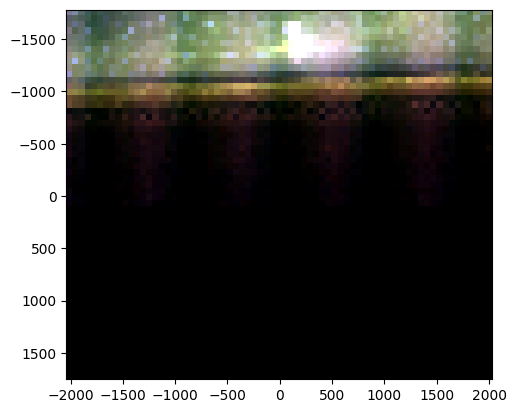

/home/daniel/Documents/shadowing/emlddmm/emlddmm.py:554: RuntimeWarning: invalid value encountered in divide
  Id = Id / (Wd + Wd.max()*1e-6)


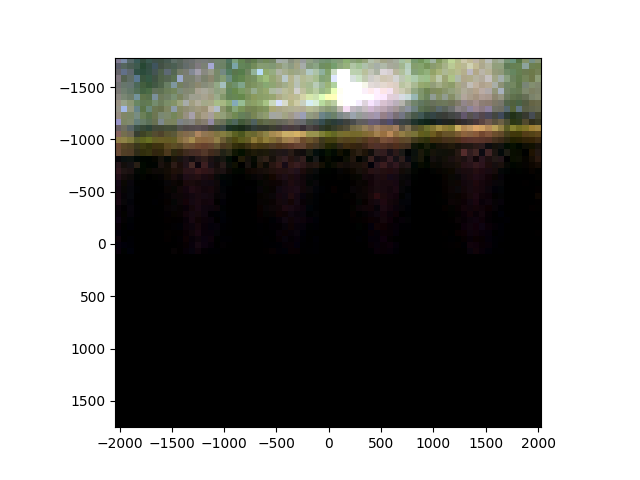

In [707]:

# load the files
fig,ax = plt.subplots()
hfig = display(fig,display_id=True)
JF_ = []
WF_ = []
xJF_ = []
nJF_ = []
count = 0
for i in range(len(all_locations)):
    if good_locations[i] and int(all_locations[i]) in locationsF: # if there is a nissl here
        file_ind = locationsF.index(int(all_locations[i]))        
        #Ji = tifffile.imread(filesF[count]) # may 1, change count to file_ind
        Ji = tifffile.imread(filesF[file_ind]) # may 1, change count to file_ind
        if Ji.dtype == np.uint8:
            Ji = Ji/255.0
        elif Ji.dtype == np.uint16:
            Ji = Ji/4096.0 # normalizing below so doesn't matter
            
        #Wi = np.ones_like(Ji[...,0])
        # check for rows or cols of 1s
        # this W variable will be 0 where pixels are bad, and 1 where pixels are good
        #Wi = np.logical_not( (np.all(Ji==1.0,axis=(0,-1),keepdims=True) + np.all(Ji==1.0,axis=(1,-1),keepdims=True)))[...,0]*1.0
        Wi = (1-np.all(Ji==0.0,axis=-1)) 
        count += 1
    else:
        # if it is missing just use a blank image and zero weights
        # insert a tiny image, and flag every pixel as bad
        Ji = np.zeros((11,11,3))
        Wi = np.zeros((11,11))
    
    nJi = np.array(Wi.shape)
    xJi = [np.arange(n)*dx - (n-1)*dx/2 for n in nJi]
    # downsample the dataset so it is about 50 microns
    xJi,Ji,Wi = emlddmm.downsample_image_domain(xJi,Ji.transpose(-1,0,1),[2**ndown]*2,Wi)
    nJi = np.array(Wi.shape)
    Wi[np.isnan(Wi)] = 0
    Ji[np.isnan(Ji)] = 0

    # normalize the data, such that the brightest pixel is white and darkest is black
    try:
        q = np.quantile(Ji[:,Wi==1],(0.2,0.99),axis=(1))
        Ji = (Ji - q[0][...,None,None]) / ( q[1][...,None,None] - q[0][...,None,None])
        Ji = Ji.clip(0,1)
    except:
        pass
    
    
    nJF_.append(nJi)    
    xJF_.append(xJi)
    JF_.append(Ji)
    WF_.append(Wi)

    ax.cla()
    ax.imshow(Ji.transpose(1,2,0),extent=emlddmm.extent_from_x(xJi))
    fig.canvas.draw()
    hfig.update(fig)
    
    
    
    

In [708]:
len(JF_),len(J_),len(all_locations)

(264, 264, 264)

In [709]:
# find a size and interpolate images to this fixed size
#q = np.ceil(np.quantile(nJ_,[0.95],0)).astype(int)
#nJ = np.concatenate([[len(all_locations)],q.squeeze()])
#dJ = np.array([dz,dx*2**ndown,dx*2**ndown])
#xJ = [np.arange(n)*d - (n-1)*d/2 for n,d in zip(nJ,dJ)]
#XJ2d = np.stack(np.meshgrid(*xJ[1:],indexing='ij'),-1)
JF__ = []
WF__ = []
A2dF0 = np.eye(3)[None].repeat(len(J_),axis=0)
for i in range(len(JF_)):
    # update A2d based on COM?

    Jb = gaussian_filter(JF_[i],sigma=(0,5,5))
    #Wb = gaussian_filter(W_[i],sigma=(5,5))
    Wb = WF_[i]
    #Jb = 1-np.mean(Jb,0)
    Jb = np.mean(Jb,0)
    Jb0 = np.sum(Jb*Wb)
    Jb10 = np.sum( Jb*Wb*xJF_[i][0][:,None] )
    Jb11 = np.sum(Jb*Wb*xJF_[i][1])
    com = [Jb10/Jb0, Jb11/Jb0]
    A2dF0[i][:2,-1] = com
    Xs = (A2d0[i][:2,:2]@XJ2d[...,None])[...,0] + A2d0[i][:2,-1]    
    
    Xs = XJ2d
    Jout = interpn(xJF_[i],(JF_[i]*WF_[i]).transpose(1,2,0),Xs,bounds_error=False,fill_value=0).transpose(-1,0,1)
    Wout = interpn(xJF_[i],(WF_[i]),Xs,bounds_error=False,fill_value=0,method='nearest')
    Jout = Jout/Wout
    Jout[np.isnan(Jout)] = 0
    Jout[np.isinf(Jout)] = 0
    Wout = (Wout==1.0).astype(float)

    JF__.append(Jout)
    WF__.append(Wout)
    
JF__ = np.stack(JF__,1)
WF__ = np.stack(WF__,0)

/tmp/ipykernel_1115386/141177080.py:28: RuntimeWarning: divide by zero encountered in divide
  Jout = Jout/Wout
/tmp/ipykernel_1115386/141177080.py:28: RuntimeWarning: invalid value encountered in divide
  Jout = Jout/Wout
/tmp/ipykernel_1115386/141177080.py:21: RuntimeWarning: invalid value encountered in scalar divide
  com = [Jb10/Jb0, Jb11/Jb0]


In [710]:
A2dF0save = A2dF0.copy()

In [711]:
A2dF0 = A2dF0save.copy()

In [712]:
A2dF0[np.isnan(A2dF0)] = 0

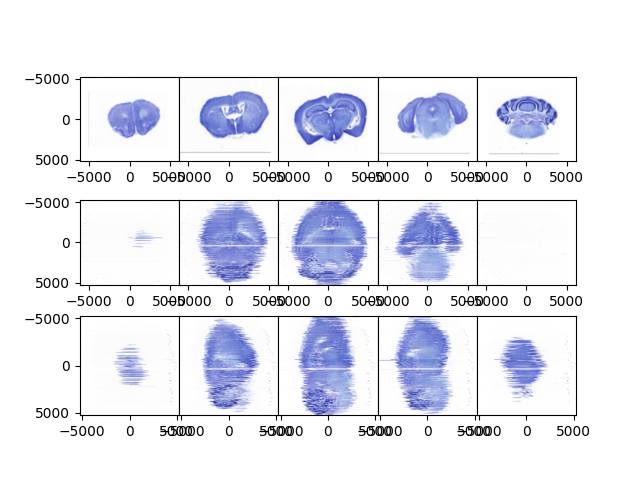

In [713]:
R = emlddmm.compose_sequence([emlddmm.Transform(A2d0,'f')],xJ)
RiJ = emlddmm.apply_transform_float(xJ,J__,R)
fig,ax = emlddmm.draw(RiJ,xJ,vmin=0,vmax=1)
fig.canvas.draw()
# looks good but recall this is not the input

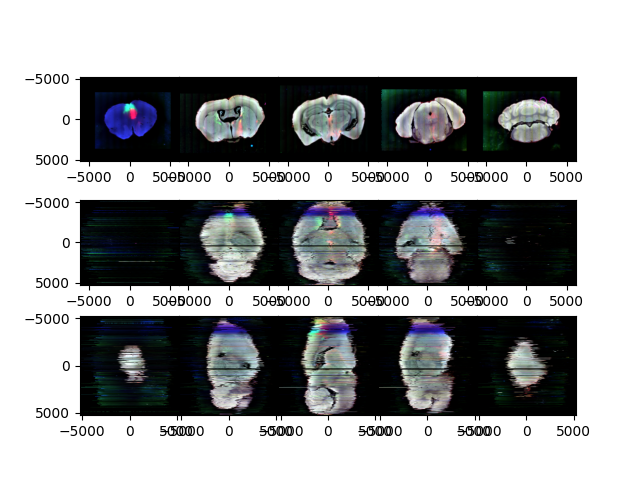

In [714]:
R = emlddmm.compose_sequence([emlddmm.Transform(A2dF0,'f')],xJ)
RiJF = emlddmm.apply_transform_float(xJ,JF__,R)
fig,ax = emlddmm.draw(RiJF,xJ,vmin=0,vmax=1)
fig.canvas.draw()
# looks good but recall this is not the input

In [715]:
J__.shape,JF__.shape

((3, 264, 179, 210), (3, 264, 179, 210))

In [716]:
downI = down_from_res(dJ,resolutions[0],is_2d=True)
# both tshould be the same
downI

array([1, 3, 3])

In [717]:
A2dF0@np.linalg.inv(A2d0)

array([[[ 1.00000000e+00,  0.00000000e+00,  2.18007633e+02],
        [ 0.00000000e+00,  1.00000000e+00, -3.11640425e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]],

       [[ 1.00000000e+00,  0.00000000e+00, -7.02092200e+01],
        [ 0.00000000e+00,  1.00000000e+00,  4.53044463e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]],

       [[ 1.00000000e+00,  0.00000000e+00,  6.38768517e+02],
        [ 0.00000000e+00,  1.00000000e+00,  3.64002446e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]],

       ...,

       [[ 1.00000000e+00,  0.00000000e+00, -4.99841564e+02],
        [ 0.00000000e+00,  1.00000000e+00, -2.83951637e+01],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]],

       [[ 1.00000000e+00,  0.00000000e+00, -6.45480178e+02],
        [ 0.00000000e+00,  1.00000000e+00, -2.05017639e+02],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]],

       [[ 1.00000000e+00,  0.00000000e+00, -1.28529385e+03],
 

# run thie nissl fluoro registration

In [718]:
# 
factor = 2

configF0 = {
    'device':'cpu',    
    'downJ':downI,    
    'downI':downI,
    'n_iter': 2000,
    #'A': A,
    'A2d':A2dF0@np.linalg.inv(A2d0),
    'dv': 500.0*10,
    'v_start':10000, # big number for no deformation
    'a': 500,
    'ev': 2e-5*factor**2*0,
    'eA':1e5*factor**2*0,
    'eA2d':1e2*factor**2, 
    'sigmaR': 5e3,    
    'sigmaM': 0.1*factor,
    'sigmaB': 0.2*factor,
    'sigmaA': 0.5*factor,
    'n_reduce_step': 0,
    'muB': 1.0,
    'muA': 0.0,    
    'update_muB':False,
    'update_muA':False,
    'local_contrast': [1,32,32],
    'Amode': 0, # 1 for rigid
    'rigid_procrustes':True, # when origin is not in center
    'slice_matching':True,
    #'slice_to_average_a':dz*4, # this is causing problems
    'small':1e-13, # for matrix inverse
}

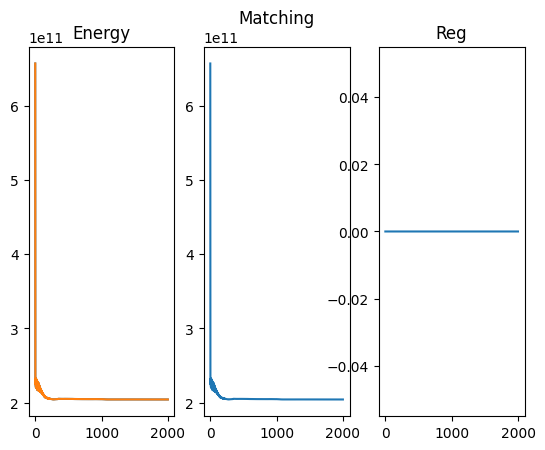

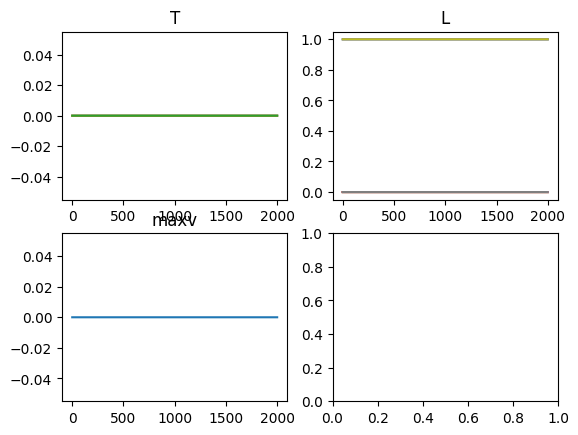

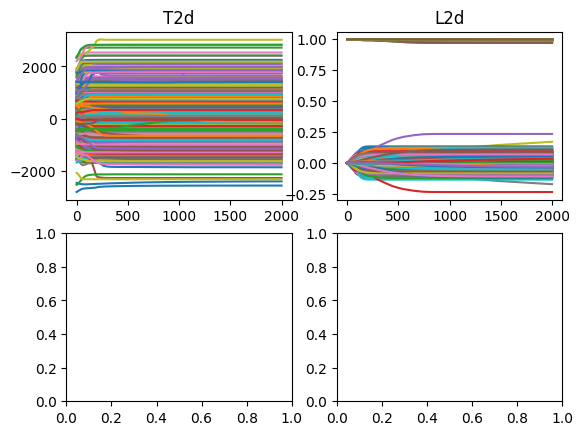

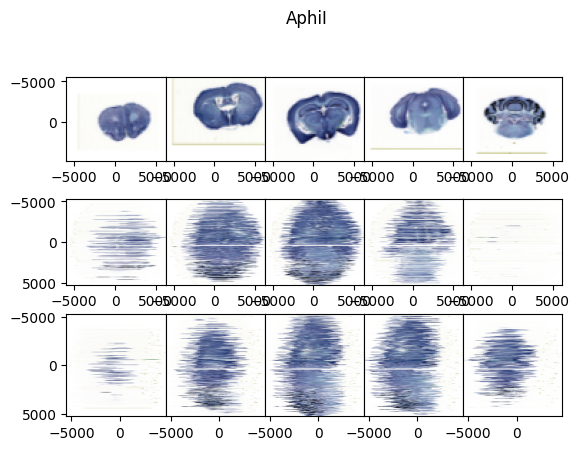

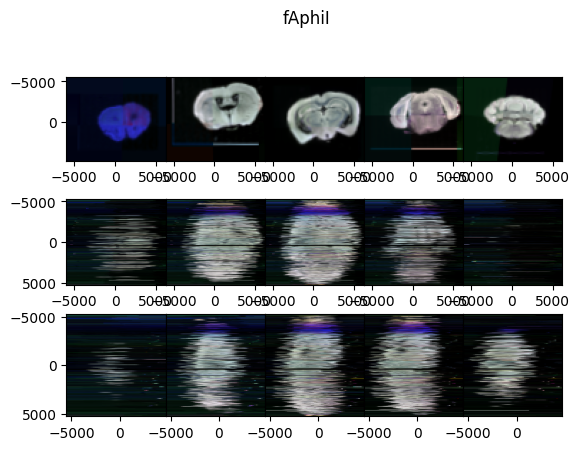

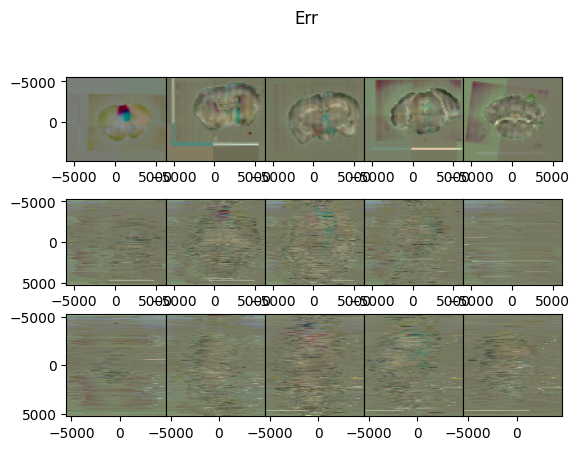

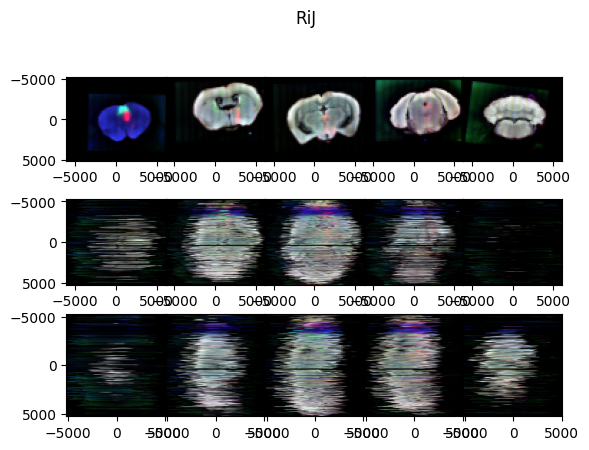

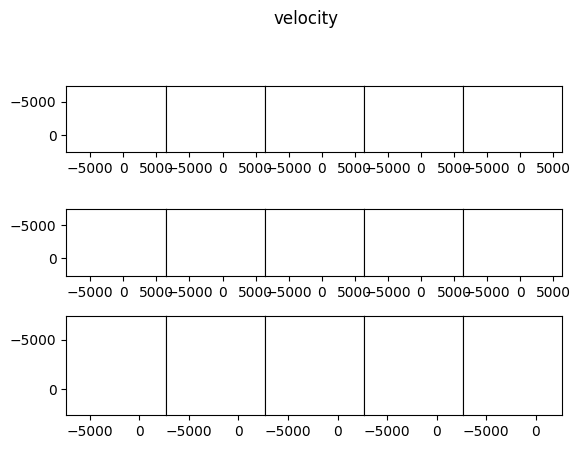

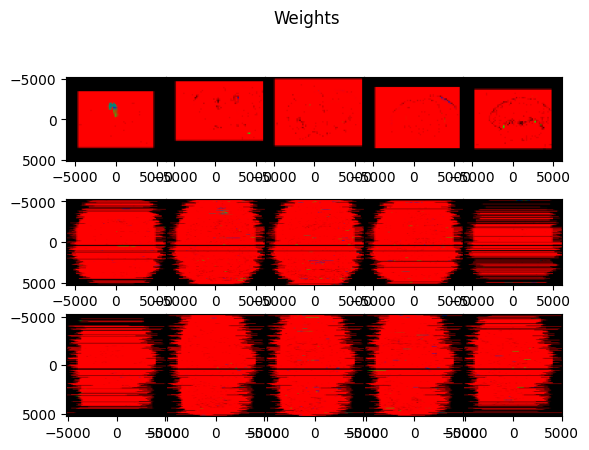

/home/daniel/Documents/shadowing/emlddmm/emlddmm.py:183: RuntimeWarning: invalid value encountered in divide
  J /= (vmax[:,None,None,None] - vmin[:,None,None,None])
/home/daniel/Documents/shadowing/emlddmm/emlddmm.py:184: RuntimeWarning: invalid value encountered in less
  J[J<0] = 0
/home/daniel/Documents/shadowing/emlddmm/emlddmm.py:185: RuntimeWarning: invalid value encountered in greater
  J[J>1] = 1


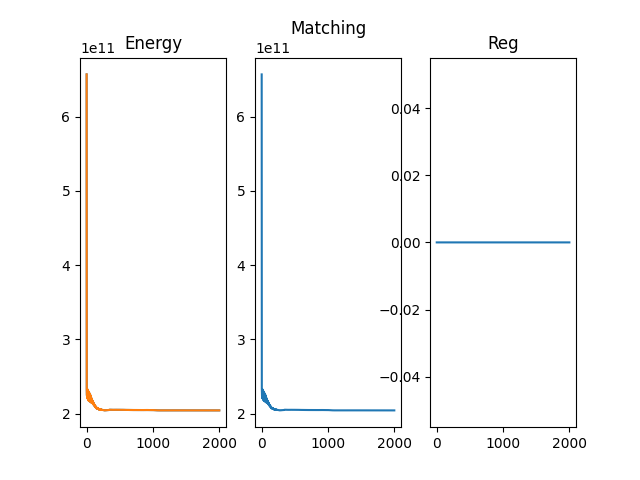

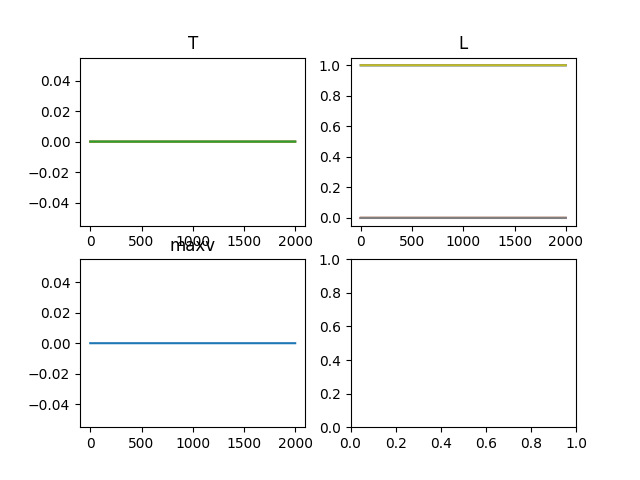

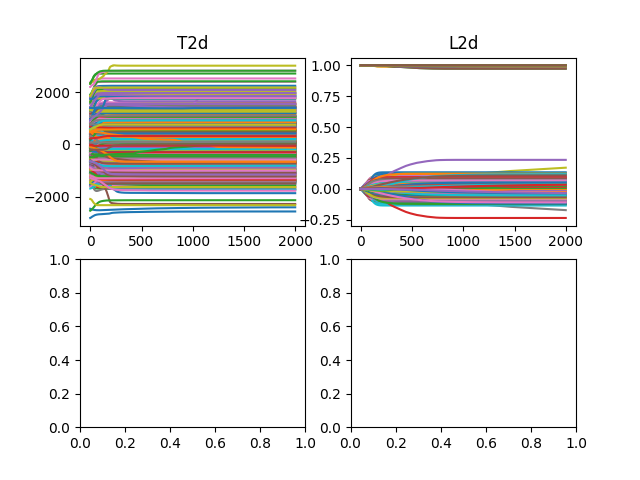

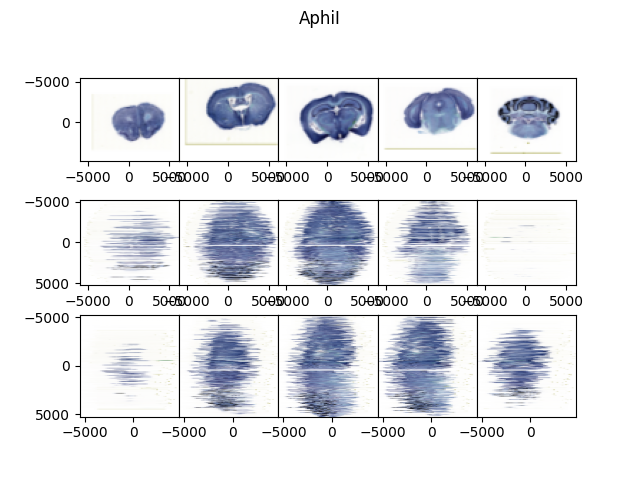

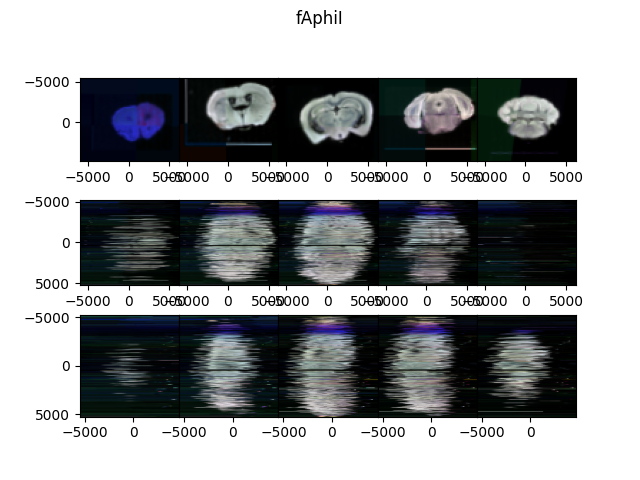

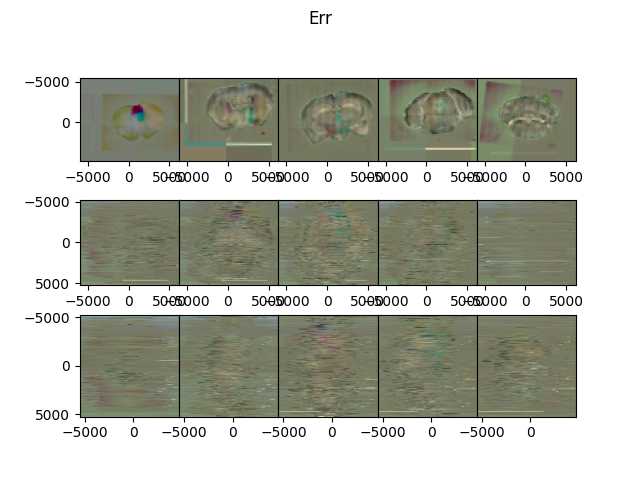

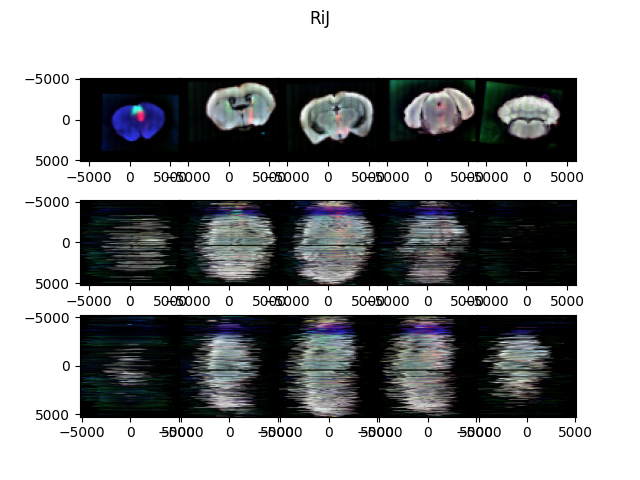

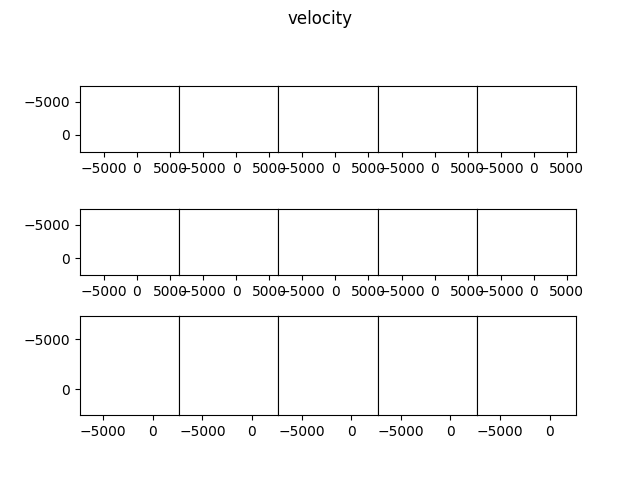

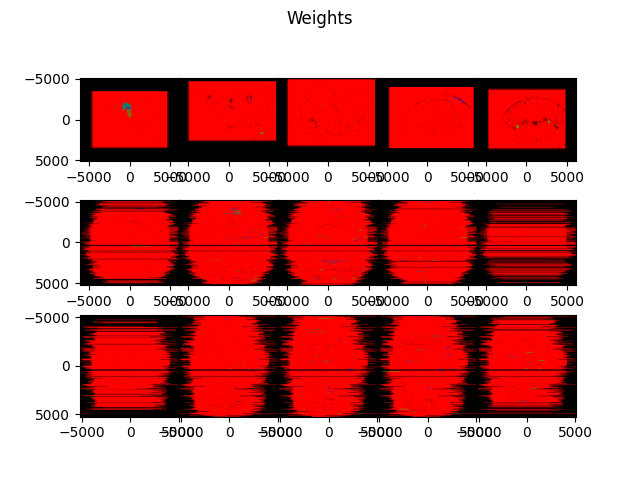

In [719]:
# do rigid only
import importlib
importlib.reload(emlddmm)
outF0 = emlddmm.emlddmm(xI=xJ,I=J__,xJ=xJ,J=JF__,W0=WF__,**configF0)

In [720]:
# view the outputs
tform = emlddmm.compose_sequence(  [emlddmm.Transform(out0['A2d']),emlddmm.Transform(outF0['A2d']),] , xJshift)
RiJF = emlddmm.apply_transform_float(xJ,JF__,tform)

(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

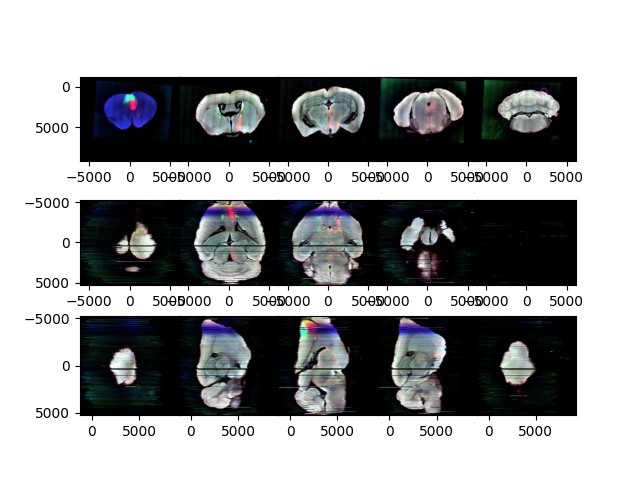

In [721]:
emlddmm.draw(RiJF,xJshift,vmin=0,vmax=1)

In [724]:
# save it
np.savez(outprefix+'outF0.npz', outF0)


In [725]:
# load it
outF0 = np.load(outprefix+'outF0.npz',allow_pickle=True)['arr_0'].item()

# Now handle the process fragments

In [790]:
# now we load the fragments
json_root = '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/skelJSON/'
# on may 1, samik says use skeljson1
json_root = '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/skelJSON1/'
#json_root = '/nfs/data/main/M32/Process_Detection/Skeleton/STP_190322/skelJSON/'
json_files = glob(join(json_root,'*'))

In [791]:
# the files have a number and I assume they match the json numbers
def jsonkey(x):
    return int(splitext(x)[0].split('_')[-1])
json_files.sort(key=jsonkey)
json_files
len(json_files)
json_nums = [jsonkey(f) for f in json_files]

In [793]:
len(files),len(json_files)

(261, 255)

In [794]:
from matplotlib.collections import LineCollection

In [795]:
JF__.shape,len(locationsF),len(json_files)

((3, 264, 179, 210), 263, 255)

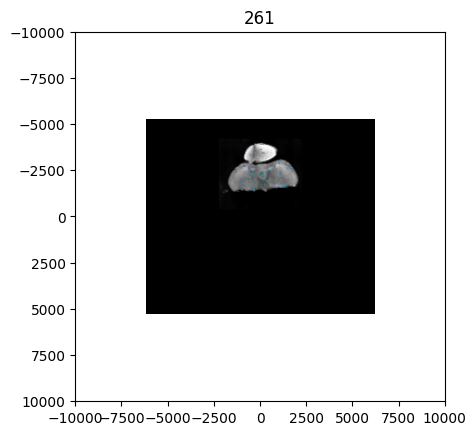

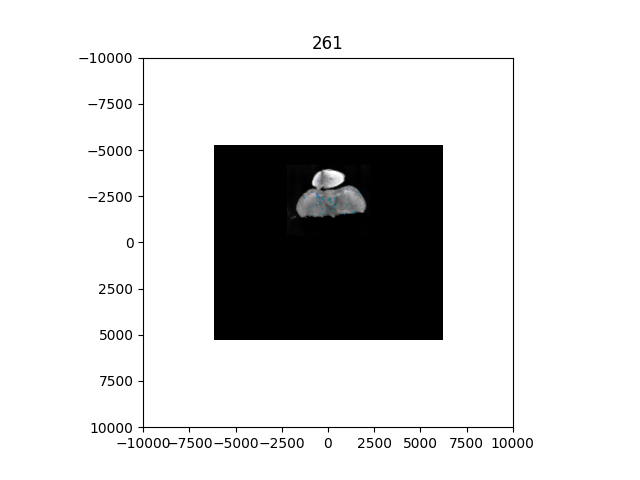

In [797]:
fig,ax = plt.subplots()
hfig = display(fig,display_id=True)
import json
all_lines_json = []
all_lines_json_0 = [] # here we will preserve connectivity information
for json_file in json_files:
    # find the z cooresponding
    slice_number = jsonkey(json_file)
    #if slice_number < 140: continue
    # 
    indF = np.where(np.array(locationsF) == slice_number)[0]
    ind = np.where(all_locations == slice_number)[0]
    if not indF.size: # otherwise we don't need indf for anything
        print(f'could not find fluoro file {indF}, slice number {slice_number}')
        lines_json = np.zeros((0,2,2)) # TODO change to 3d
        all_lines_json.append(lines_json)
        all_lines_json_0.append([lines_json])
        continue
    
    Ji = JF__[:,ind]
    #Ji = JF_[ind.item()][:,None]
    zJi = zJ[ind]
    nJi = nJ_[ind.item()] # use this for "flipping"
    ax.cla()
    ax.imshow(Ji[0,0],extent=emlddmm.extent_from_x(xJ[1:]),cmap='gray')
    #ax.imshow(Ji[0,0],extent=emlddmm.extent_from_x(xJF_[ind.item()]),cmap='gray')

    lines_json = []
    
    with open(json_file) as f:
        data = json.load(f)
    if 'features' in data:
        features = data['features']
    else:
        features = []
    if not isinstance(features,list):
        features = [features]
    for feature in features:
        
        # this feature is a multi line string
        # this means it is a list of pairs of points
        if 'coordinates' not in feature['geometry']: continue # added on may 1
        coordinates = feature['geometry']['coordinates']
        if feature['geometry']['type'] =='LineString':        
            coordinates = [coordinates]
        elif feature['geometry']['type'] == 'MultiLineString':
            pass
        else:
            asdf
        for coordinate in coordinates:
            
            # coordinate is a regular array
            # stack it on the secon last axis
            coordinate_np = np.stack( (np.array(coordinate)[:-1], np.array(coordinate)[1:] ) , -2)
            
            # scale the xy
            coordinate_np = coordinate_np*np.array([1.0,-1.0])*0.46 # ROW, NEGATIVE COL

            
            
            #coordinate_np = coordinate_np + np.stack((-xJ_[ind.item()][0][0],xJ_[ind.item()][1][0]))

            # different for this brain
            coordinate_np = coordinate_np + np.stack((xJF_[ind.item()][1][0],xJF_[ind.item()][0][0]))
            coordinate_np = coordinate_np[...,::-1] # for this brain
            
            # add the z
            lines_json.append(coordinate_np)
    if not lines_json:
        lines_json = np.zeros((0,2,2)) # TODO change to 3d
        lines_json_0 = [np.zeros((0,2,2))]
    else:
        lines_json_0 = lines_json # do not concatatenate here, note this is a list
        lines_json = np.concatenate(lines_json,0)
        linecollection = LineCollection(lines_json[:,:,::-1],alpha=0.5) # flip xy when I draw it only
        ax.add_collection(linecollection)
        ax.set_xlim(-7000,7000)
        ax.set_ylim(7000,-7000)
        ax.set_xlim(-10000,10000)
        ax.set_ylim(10000,-10000)
            
        #asdf    
            
        #asdf
        #asdf
        ax.set_title(f'{slice_number}')
        hfig.update(fig)

    
    
    all_lines_json.append(lines_json)
    all_lines_json_0.append(lines_json_0)
    
    if len(all_lines_json) != len(all_lines_json_0): asdf
    
    

In [798]:
# apply the rotation
R_all_lines_json_3d = []
R_all_lines_json_3d_0 = []
for i,json_file in enumerate(json_files):
    # find the z cooresponding
    slice_number = jsonkey(json_file)
    # 
    indF = np.where(np.array(locationsF) == slice_number)[0]
    ind = np.where(all_locations == slice_number)[0]
    if not ind.size:
        R_all_lines_json_3d.append(np.zeros((0,2,3)))
        continue
    R = outF0['A2d'][ind.item()]@out0['A2d'][ind.item()]
    Ri = np.linalg.inv(R.numpy())
    l = (Ri[:2,:2]@all_lines_json[i][...,None])[...,0] + Ri[:2,-1] 
    z = xJ[0][ind]
    R_all_lines_json_3d.append( np.concatenate( (z*np.ones((l.shape[0],l.shape[1],1)),  l ),-1)  )
    li = [(Ri[:2,:2]@a[...,None])[...,0] + Ri[:2,-1]  for a in all_lines_json_0[i] ]
    
    R_all_lines_json_3d_0.append( [   np.concatenate(   (z*np.ones((l.shape[0],l.shape[1],1)),  l )  ,-1)    for l in li])

    

In [799]:
len(all_lines_json_0),len(all_lines_json)

(255, 255)

In [801]:
all_lines_json_3d_cat = np.concatenate(all_lines_json_3d)
R_all_lines_json_3d_cat = np.concatenate(R_all_lines_json_3d)

In [802]:
from mpl_toolkits.mplot3d.art3d import Line3DCollection,Poly3DCollection

In [803]:
# load the CCF
#xC,C,_,_ = emlddmm.read_data('/home/daniel/Documents/shadowing/AllenData/average_template_50.vtk')
#xC,C,_,_ = emlddmm.read_data('/home/daniel/Documents/shadowing/AllenData/annotation_50.vtk')
xC,C,_,_ = emlddmm.read_data('/nfs/data/main/M38/AllenData/annotation_50.vtk')

In [804]:
CM = (C>0)*1.0
downC = 8
xCd,CMd = emlddmm.downsample_image_domain(xC,CM,[downC]*3)

In [805]:
from skimage.measure import marching_cubes
verts,faces,normals,values = marching_cubes(CMd[0],level=0.5,spacing=[downC*50.0]*3)
verts = verts + np.stack([x[0] for x in xCd])

In [806]:
# THIS IS FROM CCF TO OUR RAF
npzfile = 'Documents/shadowing/CCF_registration/out2.npz'
tforms = np.load(npzfile,allow_pickle=True)['arr_0'].item()
phi = emlddmm.Transform(tforms['v'],domain=tforms['xv'])
Aphiverts = emlddmm.compose_sequence([phi,emlddmm.Transform(tforms['A'])],verts.T[...,None,None]).numpy()[...,0,0].T



In [810]:
# map it
#tform = emlddmm.compose_sequence([
#   emlddmm.Transform(out0['A'],'b'),
#    emlddmm.Transform(out0['v'],'b',domain=out0['xv']),
#],)
phi = emlddmm.Transform(out0['v'],'b',domain=out0['xv'])
phiiAiRiall_lines_json = [emlddmm.compose_sequence([emlddmm.Transform(out0['A'],'b'),phi],l.transpose(-1,0,1)[...,None]).numpy()[...,0].transpose(1,2,0) for l in R_all_lines_json_3d]

In [811]:
l = R_all_lines_json_3d_0[1][0]
emlddmm.compose_sequence([emlddmm.Transform(out0['A'],'b'),phi],l.transpose(-1,0,1)[...,None]).numpy()[...,0].transpose(1,2,0)

array([], shape=(0, 2, 3), dtype=float32)

In [812]:
phiiAiRiall_lines_json_0 = [emlddmm.compose_sequence([emlddmm.Transform(out0['A'],'b'),phi],l.transpose(-1,0,1)[...,None]).numpy()[...,0].transpose(1,2,0) for li in R_all_lines_json_3d_0 for l in li]

# display a 3D figure

Text(0.5, 0, 'AP')

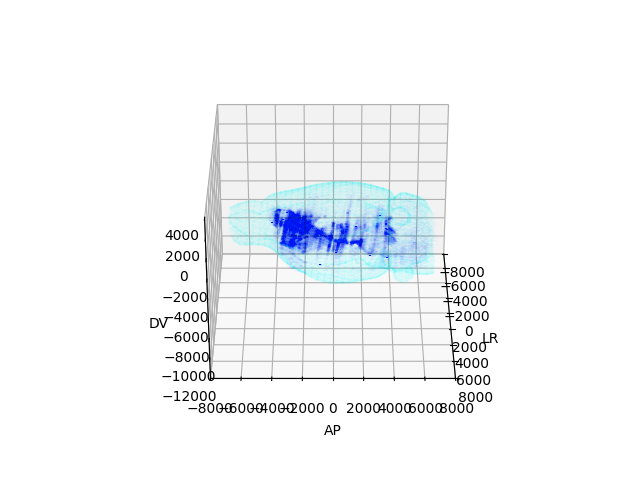

In [813]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.view_init(15,90)
ax.view_init(37,37)
#ax.view_init(90,90) # front view
#ax.view_init(90,0) # also a front view
ax.view_init(0,0) # top view
#ax.view_init(180,90) # side view
#ax.view_init(30,30)
ax.view_init(30.0,0,vertical_axis='x')
polycolor = [0.0,1.0,1.0,0.02]
polys = Poly3DCollection(Aphiverts[faces],fc=polycolor,ec=polycolor)
ax.add_collection3d(polys)
ax.set_xlim(-8000-4000,8000-4000)
ax.set_ylim(-8000,8000)
ax.set_zlim(-8000,8000)
#ax.scatter(*AphiAsomas.T,s=10,c='r')


#lc = Line3DCollection(np.concatenate(AphiAall_lines)[::100],color='r')
lc1 = Line3DCollection(np.concatenate(phiiAiRiall_lines_json)[::100],color='b')
#ax.add_collection3d(lc)
ax.add_collection3d(lc1)
ax.set_xlabel('DV')
ax.set_ylabel('LR')
ax.set_zlabel('AP')

# Get density for summarization

In [814]:
# let's voxelize these now
json_density = np.zeros_like(I[0])
# note xI stores the voxel locations in I
for line in phiiAiRiall_lines_json:
    # calculate the center
    c = np.mean(line,1)
    # calculate the length
    d = np.sum(( line[:,1]-line[:,0] )**2,-1)**0.5
    # compute a voxel index from c
    ind = c - np.stack([x[0] for x in xI])
    ind = ind/np.stack([x[1] - x[0] for x in xI])
    ind = np.round(ind).astype(int)
    ind = ind.clip(min=0,max=np.array(json_density.shape)-1)
    
    np.add.at(json_density,(ind[:,0],ind[:,1],ind[:,2]),d[:])
    
json_density = json_density / np.prod([x[1] - x[0] for x in xI])    


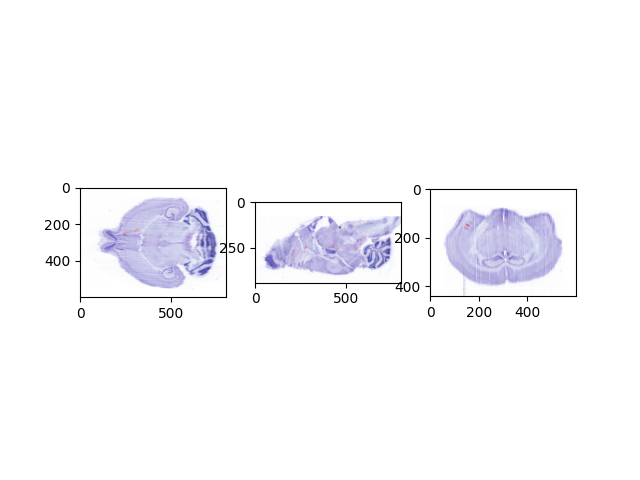

In [815]:
fig,ax = plt.subplots(1,3)

#density = np.sum(json_density,0)
density = json_density[json_density.shape[0]//2].copy()
density /= np.max(density)
toshow = np.stack((np.ones_like(density),np.ones_like(density)*0,np.ones_like(density)*0,density),-1)
ax[0].imshow(I[:,I.shape[1]//2].transpose(1,2,0))
ax[0].imshow(toshow,cmap='gray')

#density = np.sum(json_density,1)
density = json_density[:,json_density.shape[1]//2].copy()
density /= np.max(density)
toshow = np.stack((np.ones_like(density),np.ones_like(density)*0,np.ones_like(density)*0,density),-1)
ax[1].imshow(I[:,:,I.shape[2]//2].transpose(1,2,0))
ax[1].imshow(toshow)

#density = np.sum(json_density,2)
density = json_density[:,:,json_density.shape[2]//2].copy()
density /= np.max(density)
toshow = np.stack((np.ones_like(density),np.ones_like(density)*0,np.ones_like(density)*0,density),-1)
ax[2].imshow(I[:,:,:,I.shape[3]//2].transpose(1,2,0))
ax[2].imshow(toshow)

In [816]:
np.save('Fluoro_json_RAF_space.npy',np.array(phiiAiRiall_lines_json,dtype=object))

In [817]:
np.save('Fluoro_json_RAF_space_0.npy',np.array([np.array(l,dtype=object) for l in phiiAiRiall_lines_json_0],dtype=object))

In [818]:
np.save('Fluoro_json_density.npy',json_density)

In [833]:
# downsample it
xId,json_density_d = emlddmm.downsample_image_domain(xI,json_density,[5,5,5])    
json_density_d = json_density_d * np.prod([x[1] - x[0] for x in xI]) / np.prod([x[1] - x[0] for x in xId])
np.save('/nfs/data/main/M38/swc_densities/Fluoro_json_density_100um.npy',json_density_d)

In [835]:
# interpolate across missing fluoro sclices
# across missing inssl slices
# across any slice that has zero detects
# slice 119, some detects but it is an outlier and we should get rid of it

In [ ]:
# okay
# goal
# loop across fluoro images
# map into volume with some z scale.
# average

# injection masks


In [845]:
# load the injection masks and map them into atlas space in 3D
# they are located here
injection_mask_dir = '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks'
injection_mask_files = glob(join(injection_mask_dir,'*.jp2'))
def injection_mask_key(x):
    return int( x.split('_')[-1].replace('.jp2','') )
injection_mask_files.sort(key=injection_mask_key)
injection_mask_locations = [injection_mask_key(f) for f in injection_mask_files]
injection_mask_files


['/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_23.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_24.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_25.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_26.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_27.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_28.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_29.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_30.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_31.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_32.jp2',
 '/nfs/data/main/M32/Process_Detection/Skeleton/PMD1211/InjRegion_masks/PMD1211_33.jp2',
 '/nfs/data/main/M32/

In [872]:
Jinj = []
for location in all_locations:
    if location in injection_mask_locations:
        # load, downsample
        ind = injection_mask_locations.index(location)
        Ji = plt.imread(injection_mask_files[ind])
        # downsample by 32
        for i in range(5):
            n = np.array(Ji.shape)
            nd = n//2
            Ji = Ji[...,0:nd[-1]*2:2]*0.5 + Ji[...,1:nd[-1]*2:2]*0.5
            Ji = Ji[...,0:nd[-2]*2:2,:]*0.5 + Ji[...,1:nd[-2]*2:2,:]*0.5
            
        Jinj.append(Ji)
    else:
        Jinj.append(  np.zeros((11,11)) )
    

In [873]:
# interpolate to the same size as Jf
JFinj__ = []
for i in range(len(JF_)):
    
    x = [np.arange(n)*0.46*32 - (n-1)*0.46*32/2 for n in Jinj[i].shape]
    
    Jout = interpn( x,Jinj[i],Xs,bounds_error=False,fill_value=0)

    
    JFinj__.append(Jout)
    
    
JFinj__ = np.stack(JFinj__)[None]


(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

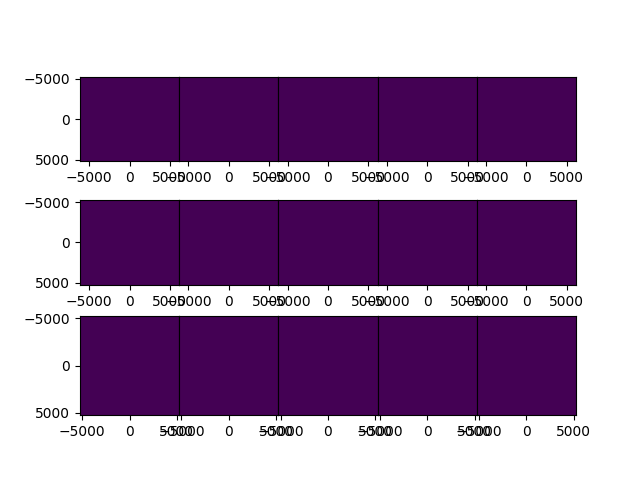

In [874]:
emlddmm.draw(JFinj__,xJ)

In [ ]:
# view the outputs
tform = emlddmm.compose_sequence(  [emlddmm.Transform(out0['A2d']),emlddmm.Transform(outF0['A2d']),] , xJshift)
RiJFinj = emlddmm.apply_transform_float(xJ,JFinj__,tform)

In [ ]:
emlddmm.draw(RiJFinj,xJshift,vmin=0,vmax=1)

In [898]:
tform_ = emlddmm.compose_sequence([
    emlddmm.Transform(out0['v'],domain=out0['xv']),
    emlddmm.Transform(out0['A']),    
],xI)



In [899]:
phiiAiJFinj = emlddmm.apply_transform_float(xJshift,RiJFinj,tform_,mode='nearest',padding_mode='zeros')
#phiiAiJFinj[phiiAiJFinj==0] = 1


(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

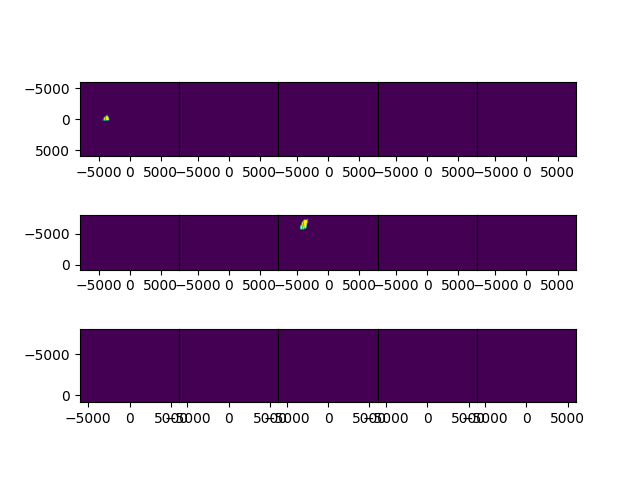

In [900]:
emlddmm.draw(phiiAiJFinj,xI,vmin=0,vmax=128)

In [ ]:
emlddmm.write_data('/nfs/data/main/M38/swc_densities/pmd_injection_mask_in_raf.vtk',xI,phiiAiJFinj.to(torch.uint8),'pmd_injection_mask_in_raf')